#Import libraries

In [ ]:
!pip install pandas pyexcel-ods

In [641]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pyexcel_ods import get_data
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import ElasticNet
from scipy.stats import ttest_rel
from scipy.stats import mannwhitneyu
from scipy.stats import f_oneway
from scipy.stats import chi2_contingency
from scipy.stats import ttest_ind

#Load Dataset 1

## Passenger Journeys Dataset

In [642]:
df = pd.read_csv('TII03.20231219005247.csv')

In [643]:
df.head()

,STATISTIC,Statistic Label,TLIST(W1),Week,C03132V03784,Luas Line,UNIT,VALUE
0,TII03C01,Passenger Journeys,2019W01,2019 Week 01,-,All Luas lines,Number,549533.0
1,TII03C01,Passenger Journeys,2019W01,2019 Week 01,1,Red line,Number,274139.0
2,TII03C01,Passenger Journeys,2019W01,2019 Week 01,2,Green line,Number,275394.0
3,TII03C01,Passenger Journeys,2019W02,2019 Week 02,-,All Luas lines,Number,839022.0
4,TII03C01,Passenger Journeys,2019W02,2019 Week 02,1,Red line,Number,408199.0


In [644]:
df.shape

(768, 8)

In [645]:
df.describe()

,VALUE
count,7.590000e+02
mean,4.378549e+05
std,2.669235e+05
min,1.972700e+04
25%,2.289615e+05
50%,4.204630e+05
75%,5.307355e+05
max,1.173473e+06


In [646]:
df.dtypes

STATISTIC           object
Statistic Label     object
TLIST(W1)           object
Week                object
C03132V03784        object
Luas Line           object
UNIT                object
VALUE              float64
dtype: object

In [647]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   STATISTIC        768 non-null    object 
 1   Statistic Label  768 non-null    object 
 2   TLIST(W1)        768 non-null    object 
 3   Week             768 non-null    object 
 4   C03132V03784     768 non-null    object 
 5   Luas Line        768 non-null    object 
 6   UNIT             768 non-null    object 
 7   VALUE            759 non-null    float64
dtypes: float64(1), object(7)
memory usage: 48.1+ KB


In [648]:
df.isna().sum()

STATISTIC          0
Statistic Label    0
TLIST(W1)          0
Week               0
C03132V03784       0
Luas Line          0
UNIT               0
VALUE              9
dtype: int64

In [649]:
# Data Cleaning (example: filling missing values with the mean)
df['VALUE'].fillna(df['VALUE'].mean(), inplace=True)

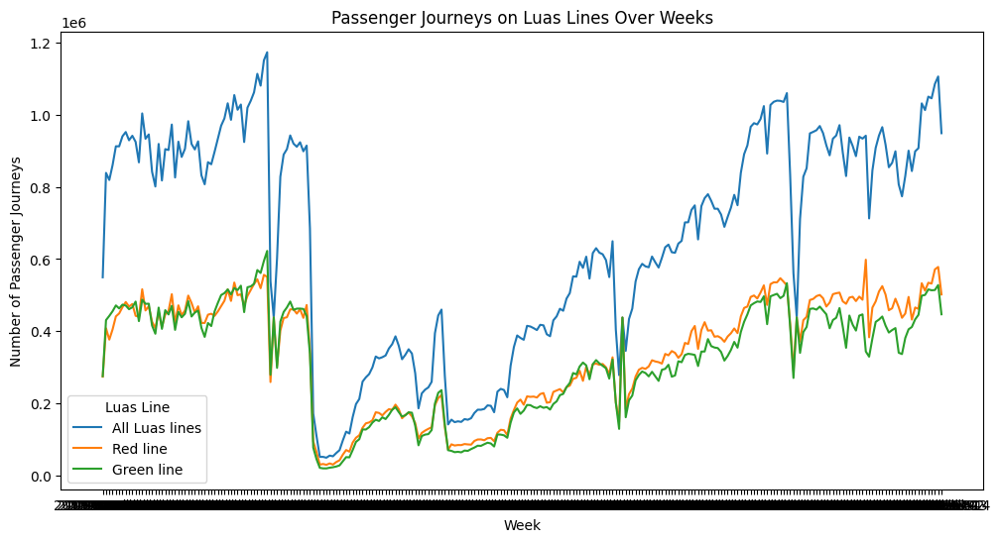

In [650]:
# Plotting passenger journeys over weeks
plt.figure(figsize=(12, 6))
sns.lineplot(x='Week', y='VALUE', hue='Luas Line', data=df)
plt.title('Passenger Journeys on Luas Lines Over Weeks')
plt.xlabel('Week')
plt.ylabel('Number of Passenger Journeys')
plt.show()

In [651]:
# Extract Year and Week from "TLIST(W1)"
df[['Year', 'Week Number']] = df['TLIST(W1)'].str.extract('(\d{4})W(\d+)')
# Display the transformed DataFrame
print(df)

    STATISTIC     Statistic Label TLIST(W1)          Week C03132V03784  \
0    TII03C01  Passenger Journeys   2019W01  2019 Week 01            -   
1    TII03C01  Passenger Journeys   2019W01  2019 Week 01            1   
2    TII03C01  Passenger Journeys   2019W01  2019 Week 01            2   
3    TII03C01  Passenger Journeys   2019W02  2019 Week 02            -   
4    TII03C01  Passenger Journeys   2019W02  2019 Week 02            1   
..        ...                 ...       ...           ...          ...   
763  TII03C01  Passenger Journeys   2023W43  2023 Week 43            1   
764  TII03C01  Passenger Journeys   2023W43  2023 Week 43            2   
765  TII03C01  Passenger Journeys   2023W44  2023 Week 44            -   
766  TII03C01  Passenger Journeys   2023W44  2023 Week 44            1   
767  TII03C01  Passenger Journeys   2023W44  2023 Week 44            2   

          Luas Line    UNIT     VALUE  Year Week Number  
0    All Luas lines  Number  549533.0  2019          

In [652]:
df.Year.unique()

array(['2019', '2020', '2021', '2022', '2023'], dtype=object)

In [653]:
df['Luas Line'].value_counts()

All Luas lines    256
Red line          256
Green line        256
Name: Luas Line, dtype: int64

In [654]:
# Data Transformation for Total Passenger Journeys by Year and Luas Line
total_passenger_journeys = df.groupby(['Year', 'Luas Line'])['VALUE'].sum().reset_index()

# Display the transformed data
print(total_passenger_journeys)

    Year       Luas Line         VALUE
0   2019  All Luas lines  4.858636e+07
1   2019      Green line  2.464075e+07
2   2019        Red line  2.438346e+07
3   2020  All Luas lines  1.939797e+07
4   2020      Green line  9.557549e+06
5   2020        Red line  9.840431e+06
6   2021  All Luas lines  1.994941e+07
7   2021      Green line  9.891705e+06
8   2021        Red line  1.049556e+07
9   2022  All Luas lines  3.929249e+07
10  2022      Green line  1.897280e+07
11  2022        Red line  2.075755e+07
12  2023  All Luas lines  4.025326e+07
13  2023      Green line  1.881672e+07
14  2023        Red line  2.143654e+07


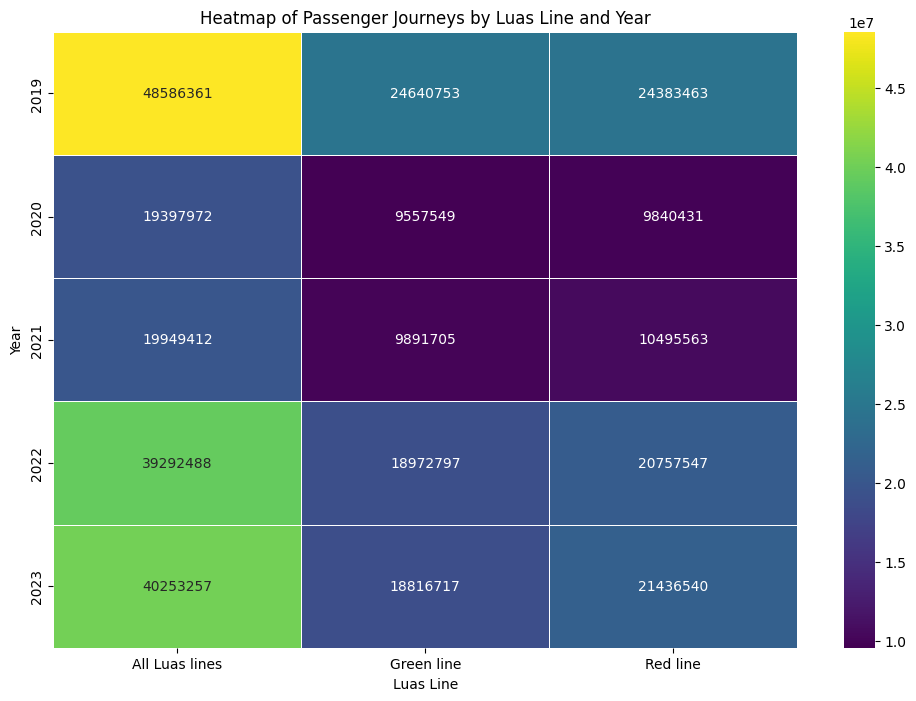

In [655]:
# Data Visualization for Heatmap of Passenger Journeys
heatmap_data = df.pivot_table(index='Year', columns='Luas Line', values='VALUE', aggfunc='sum')
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='viridis', annot=True, fmt=".0f", linewidths=.5)
plt.title('Heatmap of Passenger Journeys by Luas Line and Year')
plt.show()

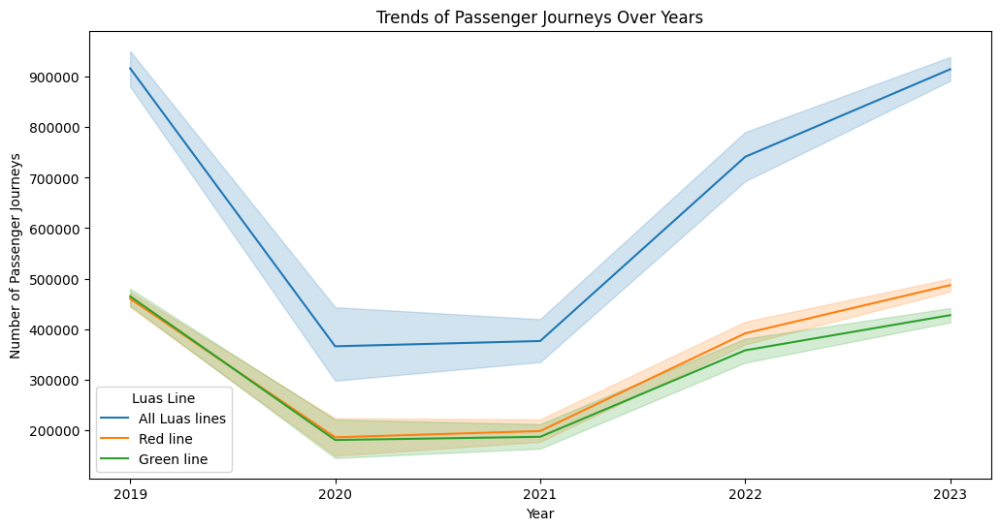

In [656]:
# Data Visualization for Trends of Passenger Journeys Over Years
plt.figure(figsize=(12, 6))
sns.lineplot(x='Year', y='VALUE', hue='Luas Line', data=df)
plt.title('Trends of Passenger Journeys Over Years')
plt.xlabel('Year')
plt.ylabel('Number of Passenger Journeys')
plt.show()

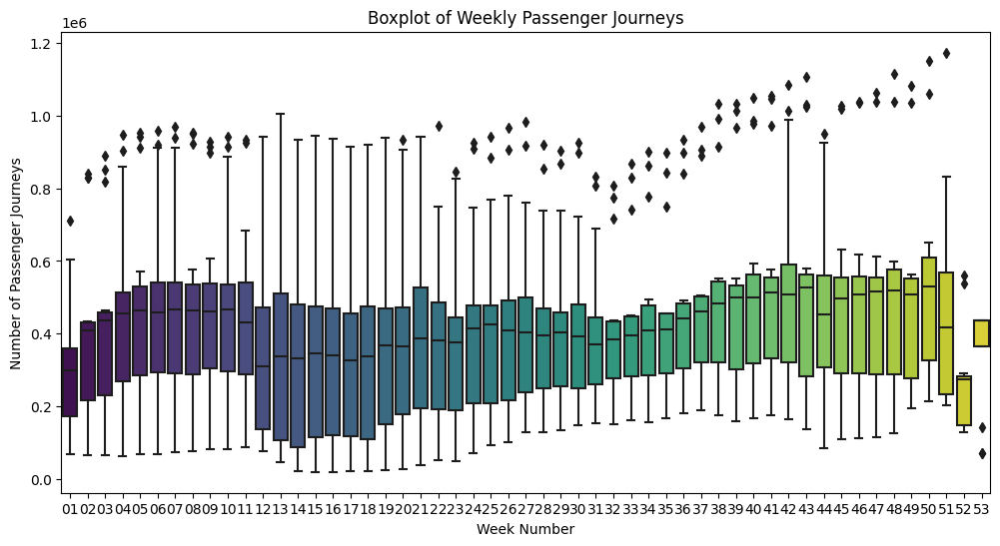

In [657]:
# Data Visualization for Boxplot of Weekly Passenger Journeys
plt.figure(figsize=(12, 6))
sns.boxplot(x='Week Number', y='VALUE', data=df, palette='viridis')
plt.title('Boxplot of Weekly Passenger Journeys')
plt.xlabel('Week Number')
plt.ylabel('Number of Passenger Journeys')
plt.show()

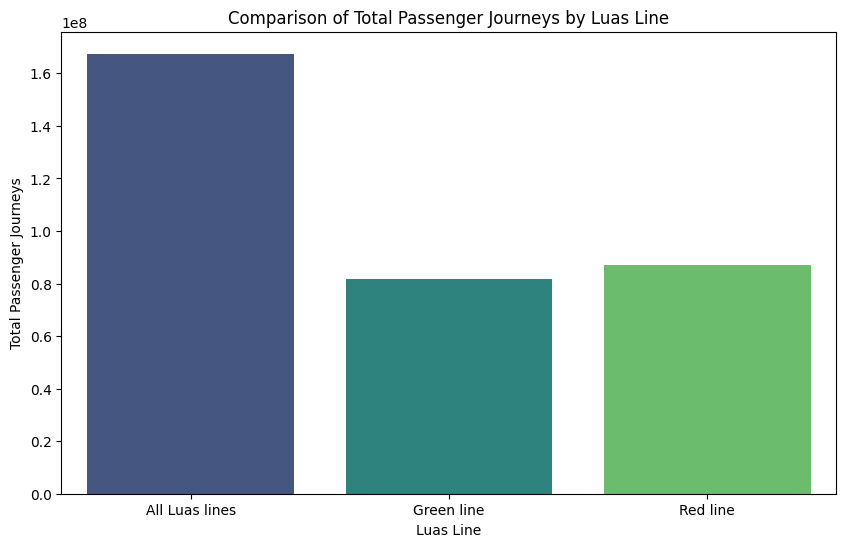

In [658]:
# Data Transformation for Comparison of Luas Lines
luas_lines_comparison = df.groupby('Luas Line')['VALUE'].sum().reset_index()

# Data Visualization for Comparison of Luas Lines
plt.figure(figsize=(10, 6))
sns.barplot(x='Luas Line', y='VALUE', data=luas_lines_comparison, palette='viridis')
plt.title('Comparison of Total Passenger Journeys by Luas Line')
plt.xlabel('Luas Line')
plt.ylabel('Total Passenger Journeys')
plt.show()

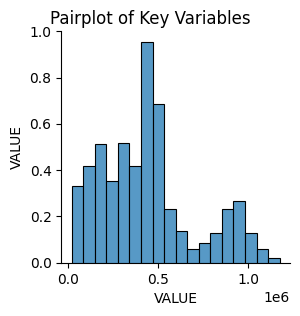

In [659]:
# Data Visualization for Pairplot
pairplot_data = df[['VALUE', 'Week Number', 'Year']]
sns.pairplot(pairplot_data, height=3, kind='scatter')
plt.suptitle('Pairplot of Key Variables', y=1.02)
plt.show()

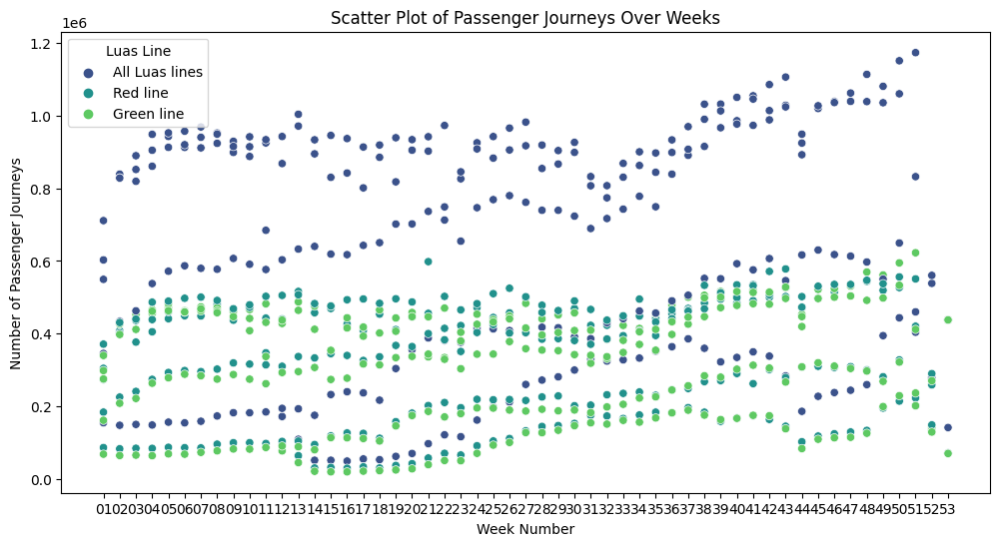

In [660]:
# Data Visualization for Scatter Plot of Passenger Journeys Over Weeks
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Week Number', y='VALUE', hue='Luas Line', data=df, palette='viridis')
plt.title('Scatter Plot of Passenger Journeys Over Weeks')
plt.xlabel('Week Number')
plt.ylabel('Number of Passenger Journeys')
plt.show()

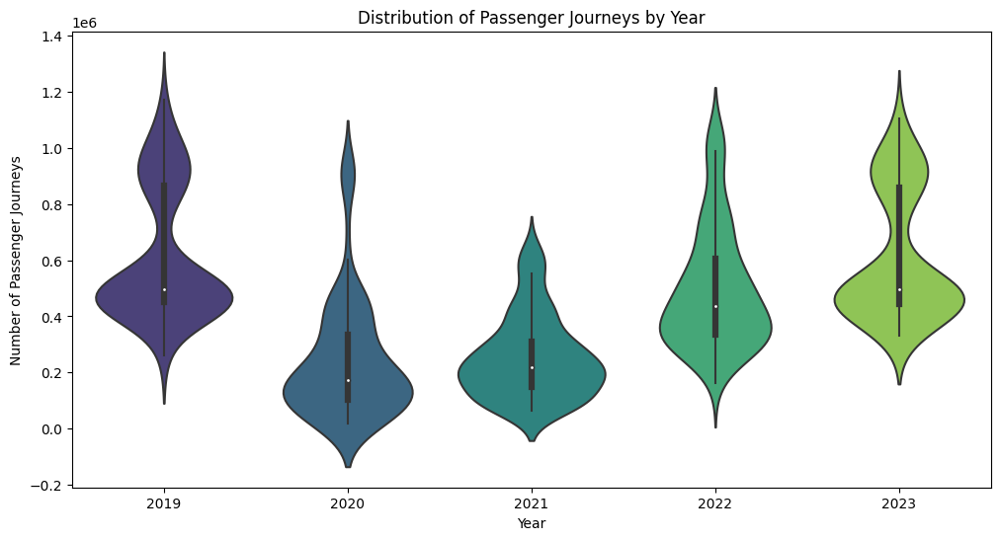

In [572]:
# Data Visualization for Distribution of Passenger Journeys by Year
plt.figure(figsize=(12, 6))
sns.violinplot(x='Year', y='VALUE', data=df, palette='viridis')
plt.title('Distribution of Passenger Journeys by Year')
plt.xlabel('Year')
plt.ylabel('Number of Passenger Journeys')
plt.show()

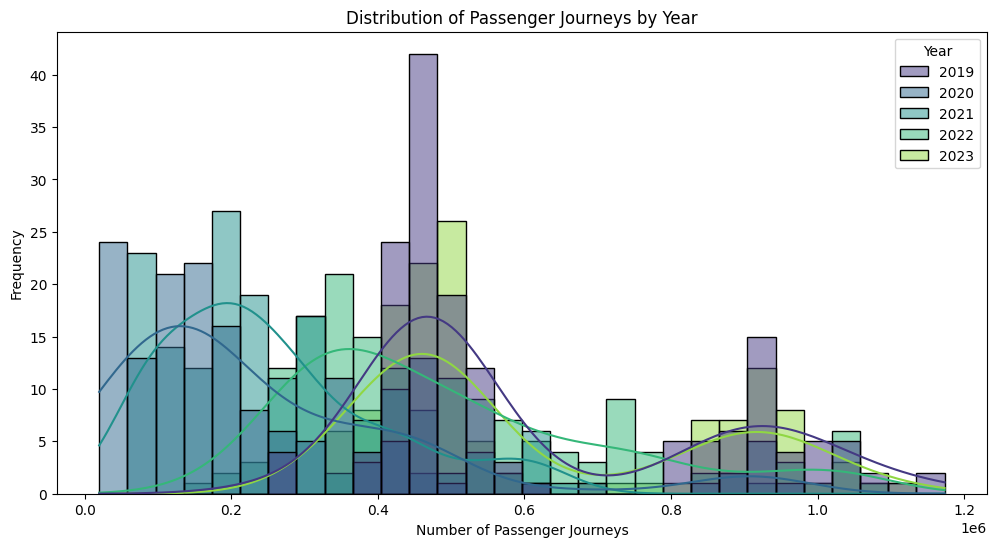

In [573]:
# Data Visualization for Distribution of Passenger Journeys by Year
plt.figure(figsize=(12, 6))
sns.histplot(x='VALUE', hue='Year', data=df, bins=30, kde=True, palette='viridis')
plt.title('Distribution of Passenger Journeys by Year')
plt.xlabel('Number of Passenger Journeys')
plt.ylabel('Frequency')
plt.show()

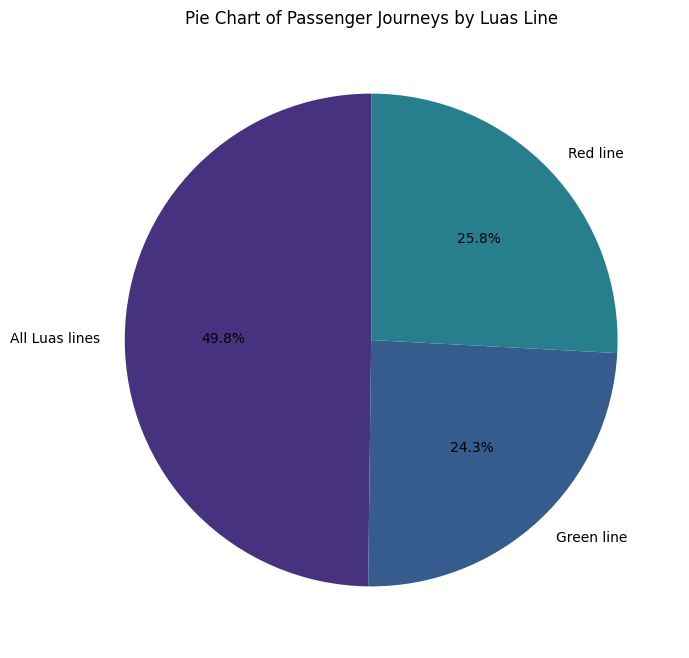

In [574]:
# Data Transformation for Pie Chart of Passenger Journeys by Luas Line
luas_lines_pie = df.groupby('Luas Line')['VALUE'].sum().reset_index()

# Data Visualization for Pie Chart of Passenger Journeys by Luas Line
plt.figure(figsize=(8, 8))
plt.pie(luas_lines_pie['VALUE'], labels=luas_lines_pie['Luas Line'], autopct='%1.1f%%', startangle=90, colors=sns.color_palette('viridis'))
plt.title('Pie Chart of Passenger Journeys by Luas Line')
plt.show()

<ipython-input-575-921ac024b32e>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = correlation_data.corr()


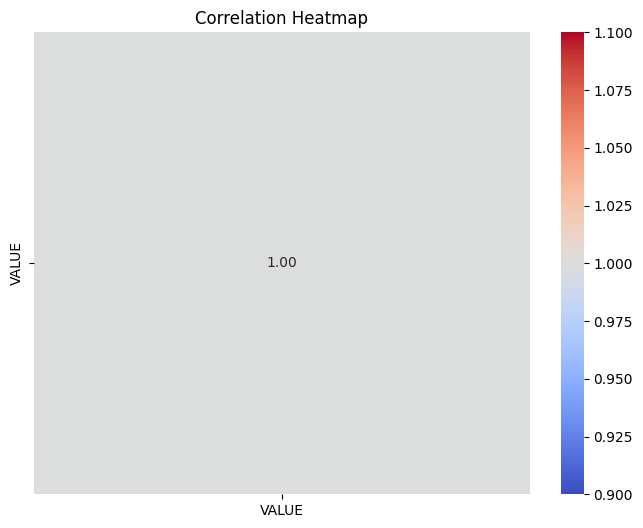

In [575]:
# Data Visualization for Correlation Heatmap
correlation_data = df[['VALUE', 'Week Number', 'Year']]
correlation_matrix = correlation_data.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

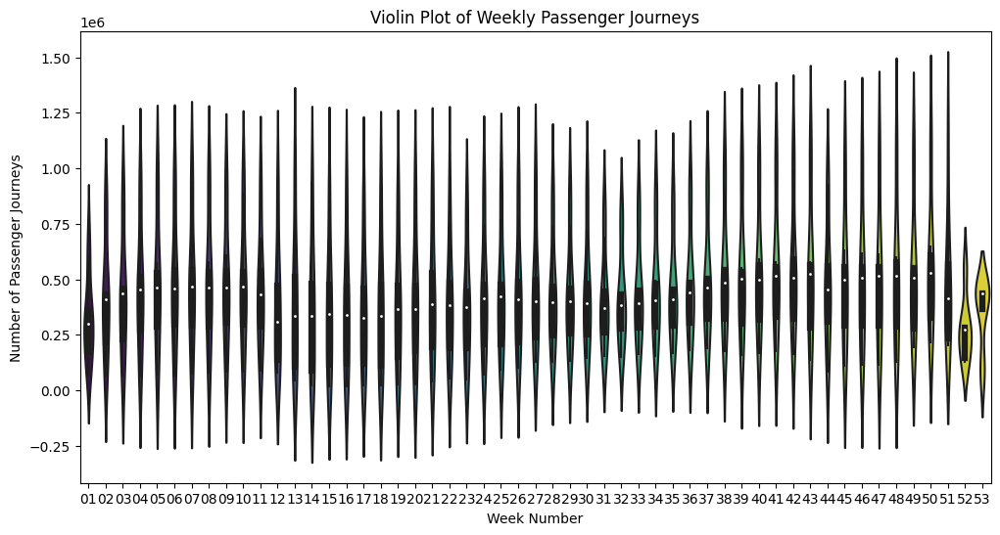

In [576]:
# Data Visualization for Violin Plot of Weekly Passenger Journeys
plt.figure(figsize=(12, 6))
sns.violinplot(x='Week Number', y='VALUE', data=df, palette='viridis')
plt.title('Violin Plot of Weekly Passenger Journeys')
plt.xlabel('Week Number')
plt.ylabel('Number of Passenger Journeys')
plt.show()

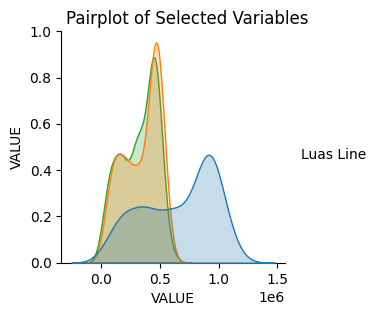

In [577]:
# Data Visualization for Pairplot of Selected Variables
selected_variables = df[['VALUE', 'Week Number', 'Year', 'Luas Line']]
sns.pairplot(selected_variables, hue='Luas Line', height=3, kind='scatter')
plt.suptitle('Pairplot of Selected Variables', y=1.02)
plt.show()

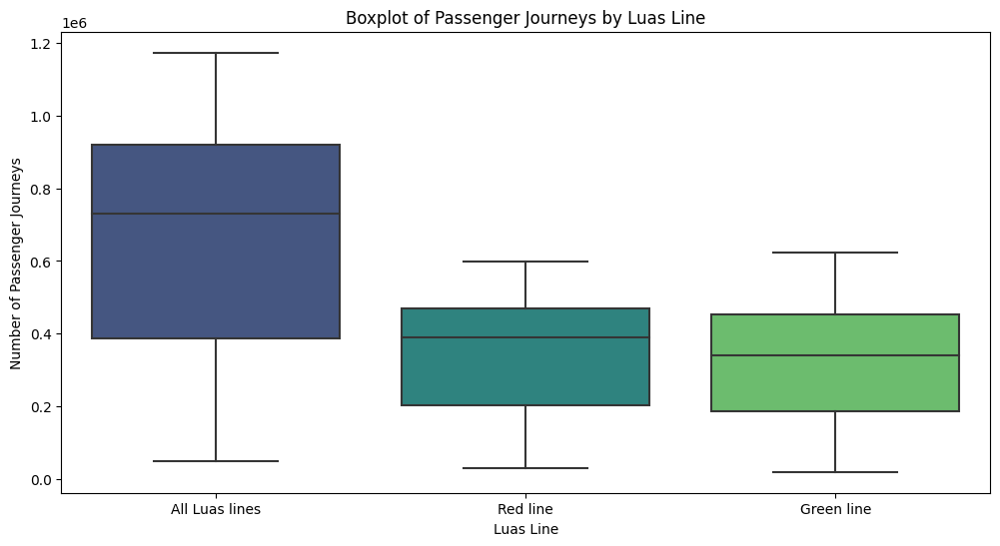

In [578]:
# Descriptive Statistics
descriptive_stats = df.describe()

# Visualization: Boxplot of Passenger Journeys by Luas Line
plt.figure(figsize=(12, 6))
sns.boxplot(x='Luas Line', y='VALUE', data=df, palette='viridis')
plt.title('Boxplot of Passenger Journeys by Luas Line')
plt.xlabel('Luas Line')
plt.ylabel('Number of Passenger Journeys')
plt.show()

In [579]:
# Drop unnecessary columns
df_processed = df.drop(['STATISTIC', 'Statistic Label', 'UNIT','Week', 'TLIST(W1)', 'Week Number'], axis=1)

In [580]:
# Label Encoding for categorical columns
label_encoder = LabelEncoder()

In [581]:
# Assuming 'C03132V03784' and 'Luas Line' are categorical columns
df_processed['C03132V03784'] = label_encoder.fit_transform(df_processed['C03132V03784'])
df_processed['Luas Line'] = label_encoder.fit_transform(df_processed['Luas Line'])

In [582]:
# Split data into X (features) and y (target)
X = df_processed.drop('VALUE', axis=1)
y = df_processed['VALUE']

In [583]:
# Create a MinMaxScaler
scaler = MinMaxScaler()
# Fit and transform the target variable
df['VALUE'] = scaler.fit_transform(df[['VALUE']])

In [584]:
# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [585]:
# Instantiate the model
model = RandomForestRegressor(random_state=42)
# Train the model
model.fit(X_train, y_train)
# Make predictions on the test set
y_pred_rf = model.predict(X_test)

In [586]:
# Evaluation Metrics
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
# Print Metrics
print(f'Random Forest Regression - Mean Squared Error: {mse_rf:.4f}')
print(f'Random Forest Regression - R-squared: {r2_rf:.4f}')
print(f'Random Forest Regression - Mean Absolute Error: {mae_rf:.4f}')

Random Forest Regression - Mean Squared Error: 16871346190.7000
Random Forest Regression - R-squared: 0.7710
Random Forest Regression - Mean Absolute Error: 93764.6149


In [587]:
# Instantiate the models
lasso_model = Lasso(random_state=42)
# Train the models
lasso_model.fit(X_train, y_train)
# Make predictions on the test set
y_pred_lasso = lasso_model.predict(X_test)
# Evaluation Metrics
mse_lasso = mean_squared_error(y_test, y_pred_lasso)
r2_lasso = r2_score(y_test, y_pred_lasso)
mae_lasso = mean_absolute_error(y_test, y_pred_lasso)
print(f'Lasso Regression - Mean Squared Error: {mse_lasso:.4f}')
print(f'Lasso Regression - R-squared: {r2_lasso:.4f}')
print(f'Lasso Regression - Mean Absolute Error: {mae_lasso:.4f}')

Lasso Regression - Mean Squared Error: 47255690807.8284
Lasso Regression - R-squared: 0.3587
Lasso Regression - Mean Absolute Error: 180323.8540


In [588]:
elasticnet_model = ElasticNet(random_state=42)
elasticnet_model.fit(X_train, y_train)
y_pred_elasticnet = elasticnet_model.predict(X_test)
mse_elasticnet = mean_squared_error(y_test, y_pred_elasticnet)
r2_elasticnet = r2_score(y_test, y_pred_elasticnet)
mae_elasticnet = mean_absolute_error(y_test, y_pred_elasticnet)
print(f'ElasticNet Regression - Mean Squared Error: {mse_elasticnet:.4f}')
print(f'ElasticNet Regression - R-squared: {r2_elasticnet:.4f}')
print(f'ElasticNet Regression - Mean Absolute Error: {mae_elasticnet:.4f}')

ElasticNet Regression - Mean Squared Error: 51226494786.7559
ElasticNet Regression - R-squared: 0.3048
ElasticNet Regression - Mean Absolute Error: 187685.3300


In [589]:
svr_model = SVR()
svr_model.fit(X_train, y_train)
y_pred_svr = svr_model.predict(X_test)
mse_svr = mean_squared_error(y_test, y_pred_svr)
r2_svr = r2_score(y_test, y_pred_svr)
mae_svr = mean_absolute_error(y_test, y_pred_svr)
print(f'Support Vector Regression - Mean Squared Error: {mse_svr:.4f}')
print(f'Support Vector  Regression - R-squared: {r2_svr:.4f}')
print(f'Support Vector  Regression - Mean Absolute Error: {mae_svr:.4f}')

Support Vector Regression - Mean Squared Error: 74061256137.4221
Support Vector  Regression - R-squared: -0.0051
Support Vector  Regression - Mean Absolute Error: 217021.1421


In [590]:
gb_model = GradientBoostingRegressor(random_state=42)
gb_model.fit(X_train, y_train)
y_pred_gb = gb_model.predict(X_test)
mse_gb = mean_squared_error(y_test, y_pred_gb)
r2_gb = r2_score(y_test, y_pred_gb)
mae_gb = mean_absolute_error(y_test, y_pred_gb)
print(f'Gradient Boosting Regression - Mean Squared Error: {mse_gb:.4f}')
print(f'Gradient Boosting Regression - R-squared: {r2_gb:.4f}')
print(f'Gradient Boosting Regression - Mean Absolute Error: {mae_gb:.4f}')

Gradient Boosting Regression - Mean Squared Error: 16860764839.0797
Gradient Boosting Regression - R-squared: 0.7712
Gradient Boosting Regression - Mean Absolute Error: 93752.4867


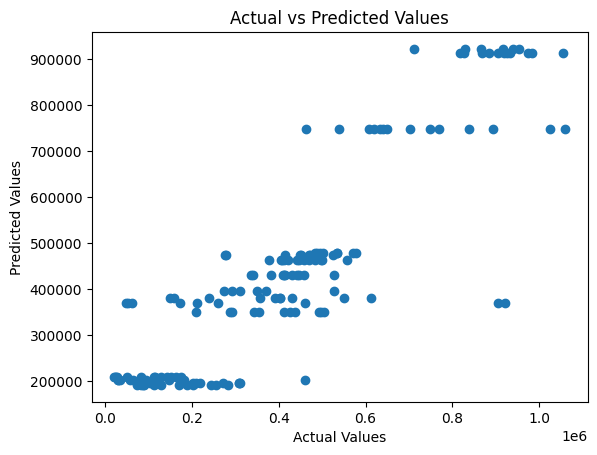

In [591]:
# Plot actual vs predicted values
plt.scatter(y_test, y_pred_rf)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

#Dataset 2

## Passenger numbers by city and central London station

In [594]:
# Read data from ODS file
ods_data = get_data('rai0201.ods')
# Extract data from the RAI0201 sheet
df2 = pd.DataFrame(ods_data['RAI0201'][4:])

In [595]:
# Set the header row
df2.columns = df2.iloc[0]
# Drop the original header row
df2 = df2[1:]
df2 = df2.iloc[:, :13 + 1]

In [596]:
df2.head()

,Year,City or London by station [note 9],"AM peak arrivals (07:00 to 09:59), number of services","AM peak arrivals (07:00 to 09:59), total seats [note 2]","AM peak arrivals (07:00 to 09:59), passengers [note 2]","All day arrivals, number of services","All day arrivals, total seats [note 2]","All day arrivals, passengers [note 2]","PM peak departures (16:00 to 18:59), number of services","PM peak departures (16:00 to 18:59), total seats [note 2]",PM peak departures (16:00 to 18:59) passengers [note 2],"All day departures, number of services","All day departures, total seats [note 2]","All day departures, passengers [note 2]"
1,2010,Birmingham [note 3],181,49720,35756,[x],[x],[x],186,50273,36119,[x],[x],[x]
2,2010,Bristol [note 4],52,12774,8276,[x],[x],[x],52,12169,8319,[x],[x],[x]
3,2010,Cardiff [note 5],113,19901,10317,[x],[x],[x],114,19888,11105,[x],[x],[x]
4,2010,Leeds,110,26906,23331,[x],[x],[x],112,27186,23763,[x],[x],[x]
5,2010,Leicester,38,11056,5398,[x],[x],[x],37,10261,5916,[x],[x],[x]


In [597]:
columns_to_replace = ['All day arrivals, number of services','All day arrivals, total seats [note 2]','All day arrivals, passengers [note 2]','All day departures, number of services','All day departures, total seats [note 2]','All day departures, passengers [note 2]']

# Replace '[x]' with NaN and then fill NaN with the mean of each column
df2[columns_to_replace] = df2[columns_to_replace].replace('[x]', np.nan).astype(float)

# Fill NaN values with the mean of each column
df2[columns_to_replace] = df2[columns_to_replace].fillna(df2[columns_to_replace].mean())
# Convert 'Year' to string
df2['Year'] = df2['Year'].astype(str)

In [598]:
# Display basic statistics
print(df2.describe())

0      All day arrivals, number of services  \
count                            318.000000   
mean                             615.836735   
std                              866.386291   
min                               99.000000   
25%                              211.000000   
50%                              349.000000   
75%                              666.500000   
max                             5213.000000   

0      All day arrivals, total seats [note 2]  \
count                            3.180000e+02   
mean                             2.522981e+05   
std                              4.362932e+05   
min                              2.293800e+04   
25%                              7.031875e+04   
50%                              1.354850e+05   
75%                              2.522981e+05   
max                              2.677463e+06   

0      All day arrivals, passengers [note 2]  \
count                           3.180000e+02   
mean                            9.8330

In [599]:
# Convert non-string values in 'City or London by station [note 9]' to strings
df2['City or London by station [note 9]'] = df2['City or London by station [note 9]'].astype(str)

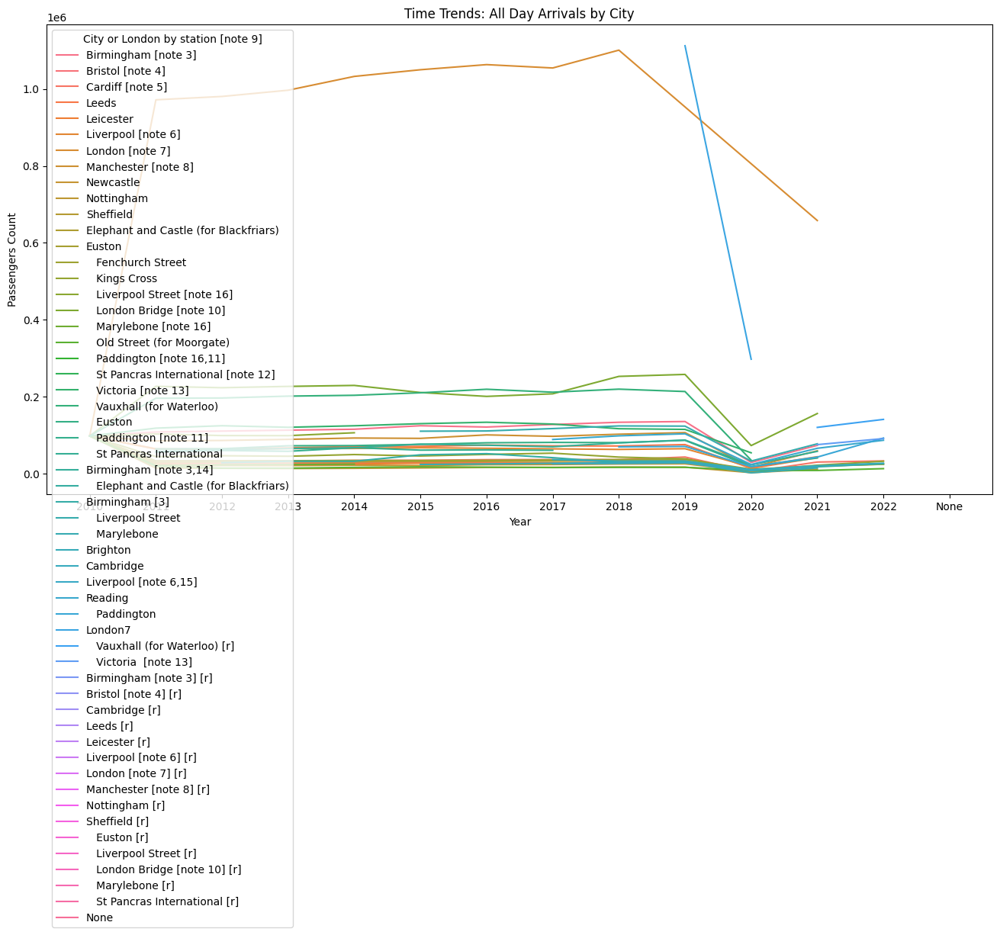

In [600]:
# Time Trends
plt.figure(figsize=(16, 8))
sns.lineplot(x='Year', y='All day arrivals, passengers [note 2]', hue='City or London by station [note 9]', data=df2)
plt.title('Time Trends: All Day Arrivals by City')
plt.xlabel('Year')
plt.ylabel('Passengers Count')
plt.show()

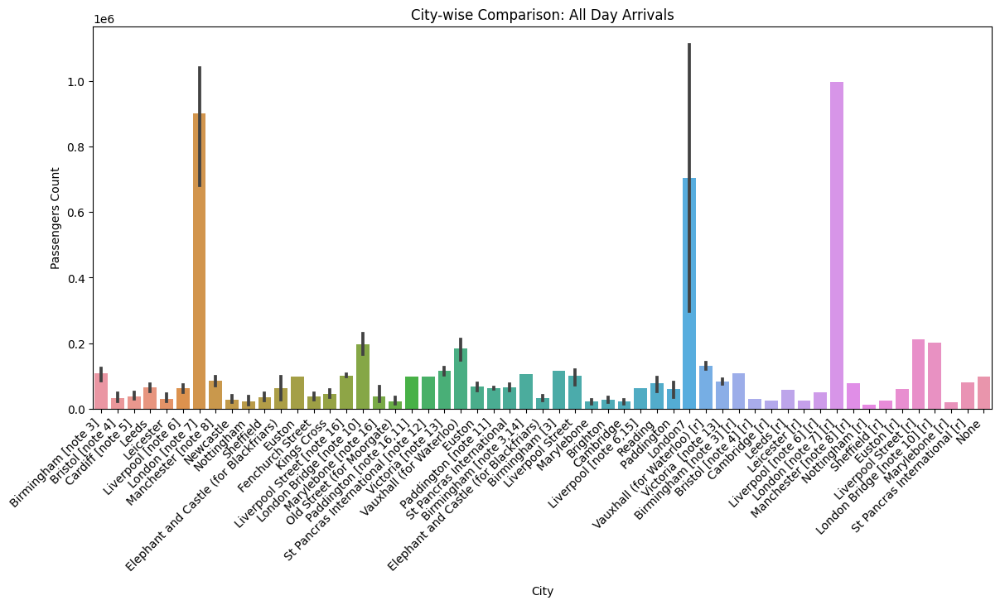

In [601]:
# City-wise Comparison
plt.figure(figsize=(14, 6))
sns.barplot(x='City or London by station [note 9]', y='All day arrivals, passengers [note 2]', data=df2)
plt.title('City-wise Comparison: All Day Arrivals')
plt.xlabel('City')
plt.ylabel('Passengers Count')
plt.xticks(rotation=45, ha='right')
plt.show()

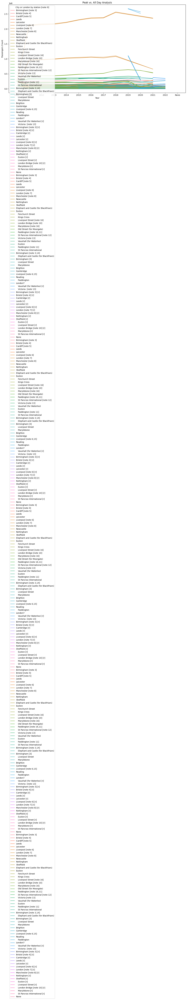

In [602]:
# Peak vs. All Day Analysis
plt.figure(figsize=(16, 8))
for col in columns_to_replace:
    sns.lineplot(x='Year', y=col, hue='City or London by station [note 9]', data=df2)
plt.title('Peak vs. All Day Analysis')
plt.xlabel('Year')
plt.ylabel('Passengers Count')
plt.show()

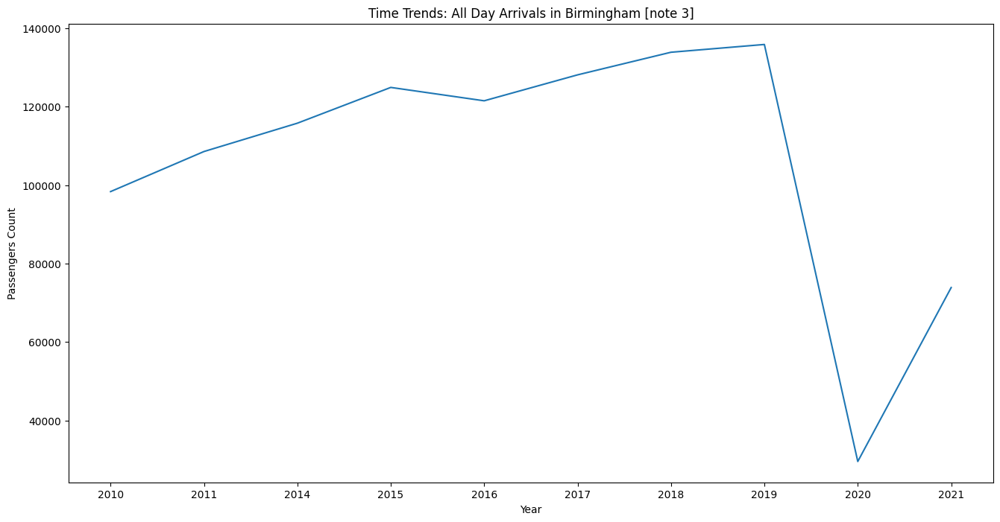

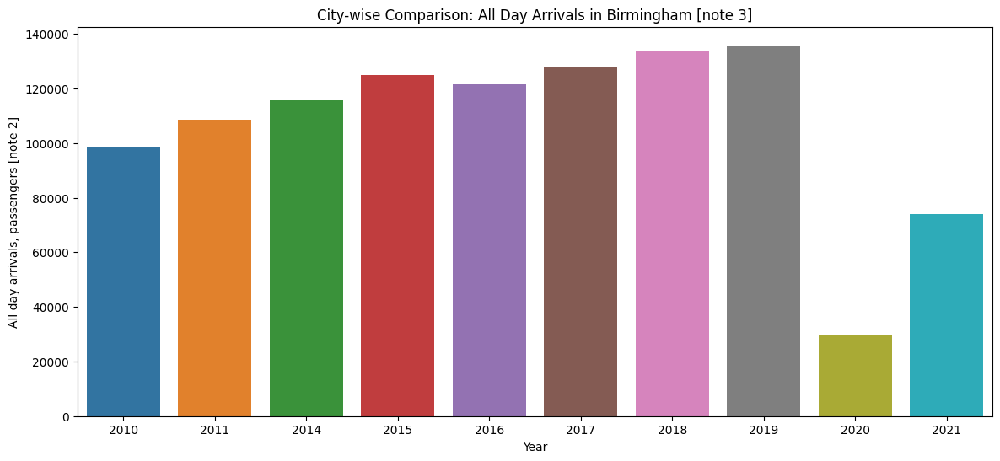

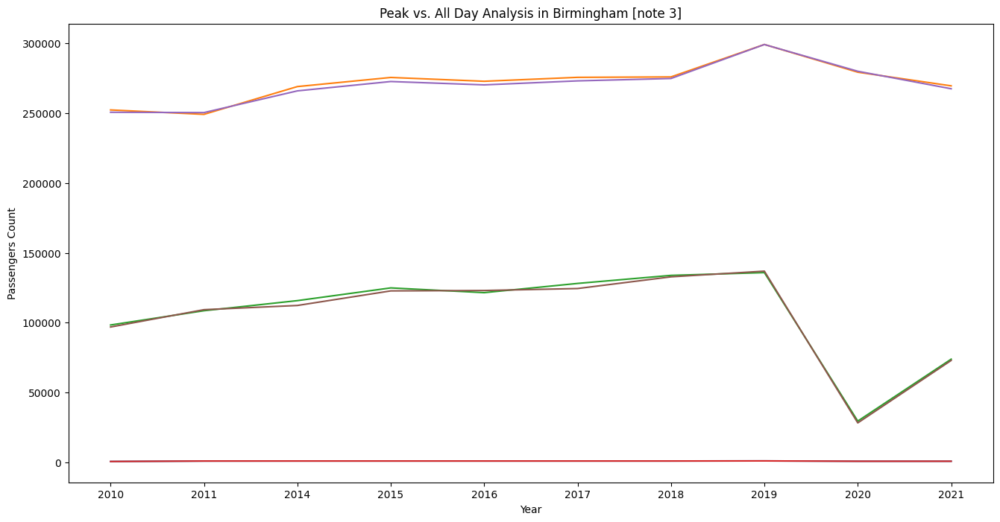

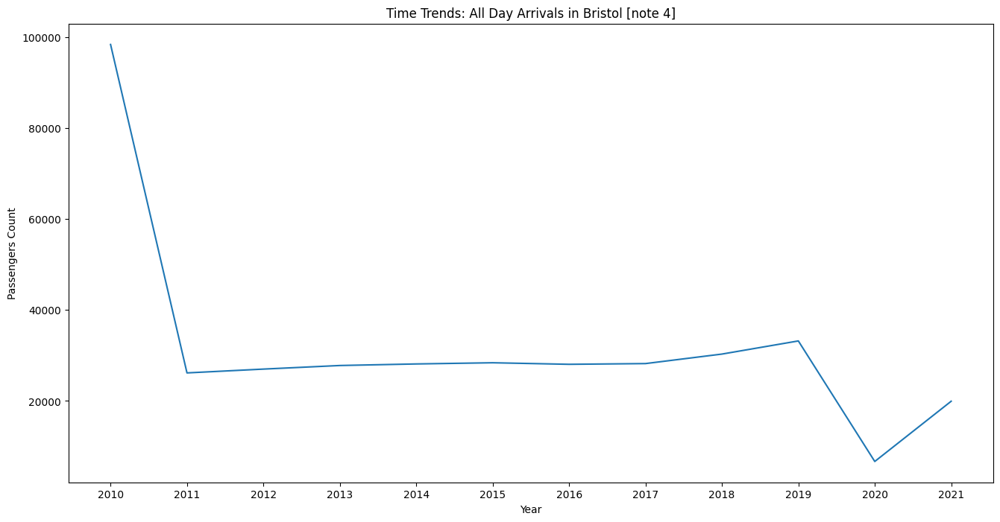

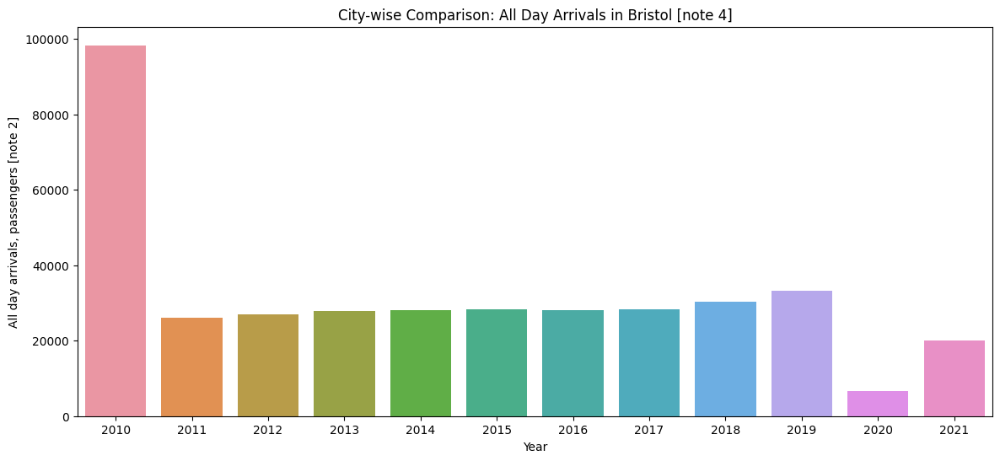

...

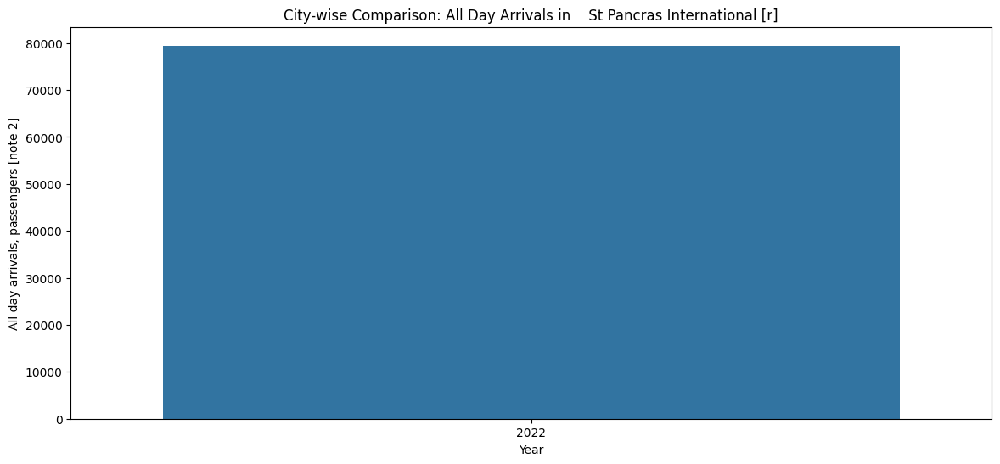

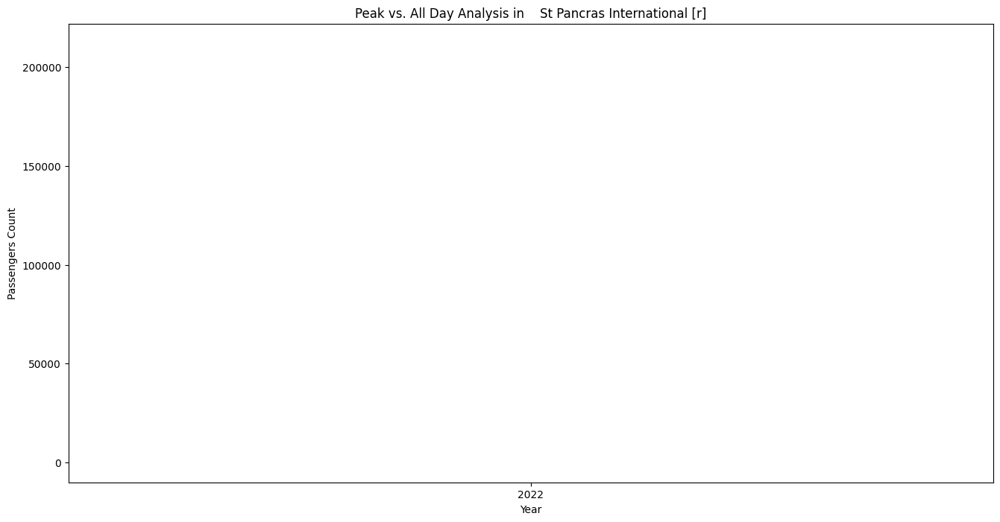

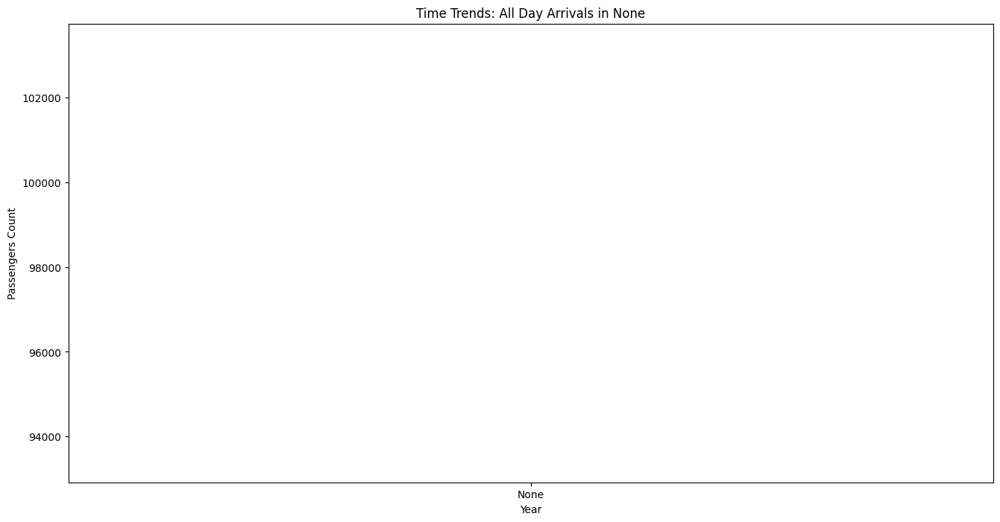

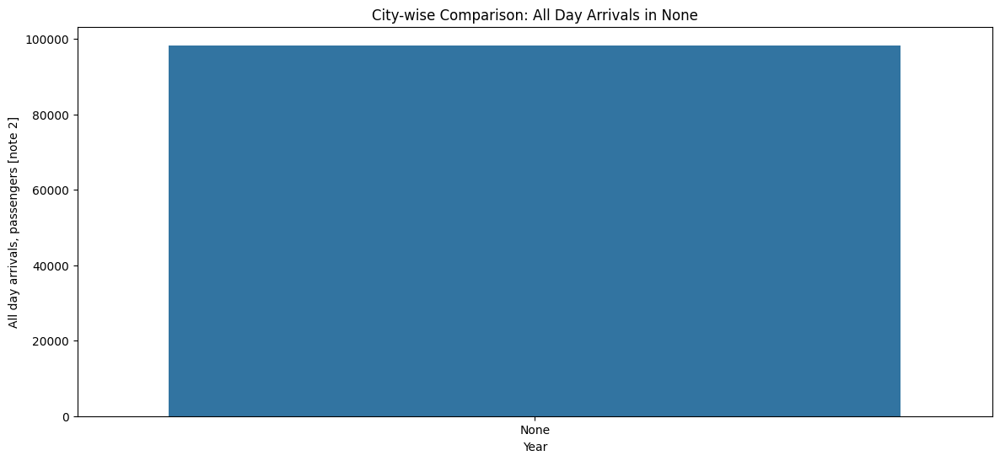

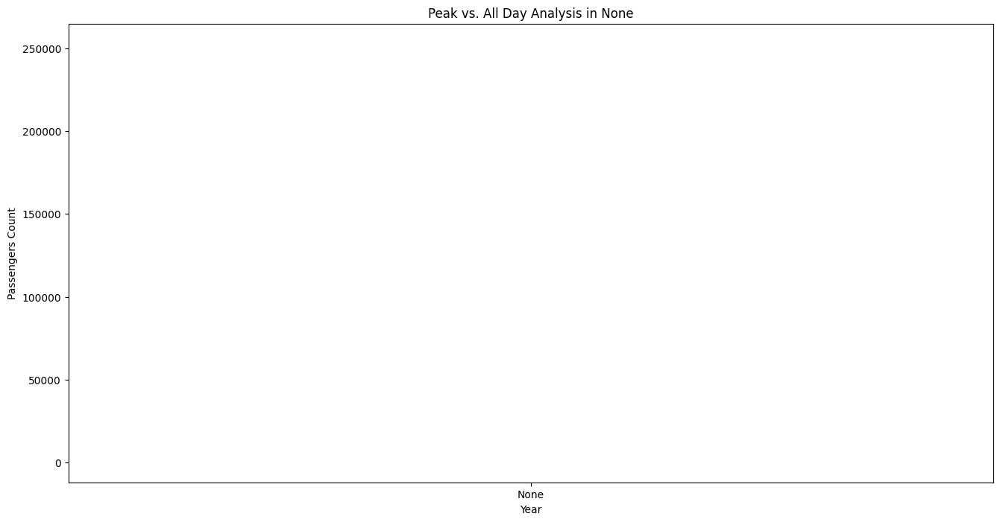

In [603]:
# Perform separate analysis for each city or station
unique_cities = df2['City or London by station [note 9]'].unique()

for city in unique_cities:
    city_data = df2[df2['City or London by station [note 9]'] == city]

    # 1. Time Trends
    plt.figure(figsize=(16, 8))
    sns.lineplot(x='Year', y='All day arrivals, passengers [note 2]', data=city_data)
    plt.title(f'Time Trends: All Day Arrivals in {city}')
    plt.xlabel('Year')
    plt.ylabel('Passengers Count')
    plt.show()

    if not city_data.empty:
        # 2. City-wise Comparison
        plt.figure(figsize=(14, 6))
        sns.barplot(x='Year', y='All day arrivals, passengers [note 2]', data=city_data)
        plt.title(f'City-wise Comparison: All Day Arrivals in {city}')
        plt.xlabel('Year')
        plt.ylabel('All day arrivals, passengers [note 2]')
        plt.show()
    else:
        print(f"No data available for {city}")

    # 3. Peak vs. All Day Analysis
    plt.figure(figsize=(16, 8))
    for col in columns_to_replace:
        sns.lineplot(x='Year', y=col, data=city_data)
    plt.title(f'Peak vs. All Day Analysis in {city}')
    plt.xlabel('Year')
    plt.ylabel('Passengers Count')
    plt.show()

In [604]:
df2.isna().sum()

0
Year                                                         0
City or London by station [note 9]                           0
AM peak arrivals (07:00 to 09:59), number of services        1
AM peak arrivals (07:00 to 09:59), total seats [note 2]      1
AM peak arrivals (07:00 to 09:59), passengers [note 2]       1
All day arrivals, number of services                         0
All day arrivals, total seats [note 2]                       0
All day arrivals, passengers [note 2]                        0
PM peak departures (16:00 to 18:59), number of services      1
PM peak departures (16:00 to 18:59), total seats [note 2]    1
PM peak departures (16:00 to 18:59) passengers [note 2]      1
All day departures, number of services                       0
All day departures, total seats [note 2]                     0
All day departures, passengers [note 2]                      0
dtype: int64

In [605]:
# Remove rows with all NaN values
df2 = df2.dropna(how='all')

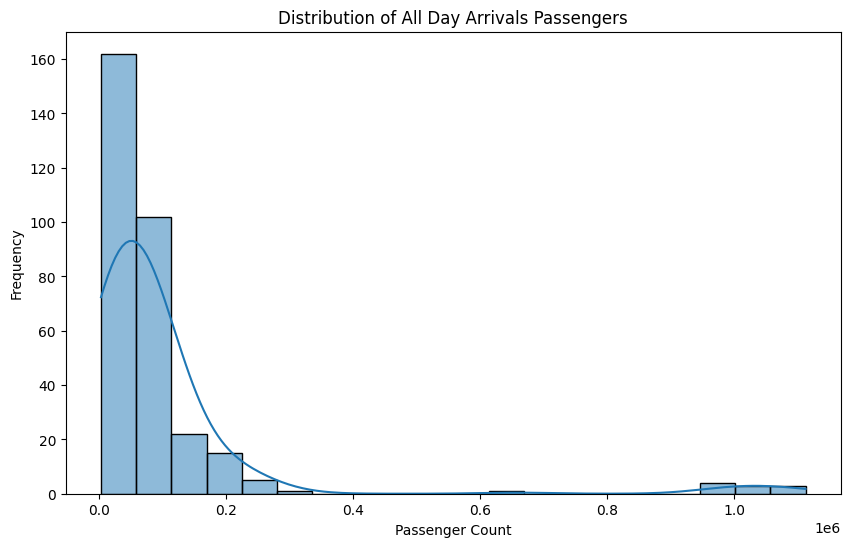

In [606]:
# Visualize the distribution of passenger counts
plt.figure(figsize=(10, 6))
sns.histplot(df2['All day arrivals, passengers [note 2]'], bins=20, kde=True)
plt.title('Distribution of All Day Arrivals Passengers')
plt.xlabel('Passenger Count')
plt.ylabel('Frequency')
plt.show()

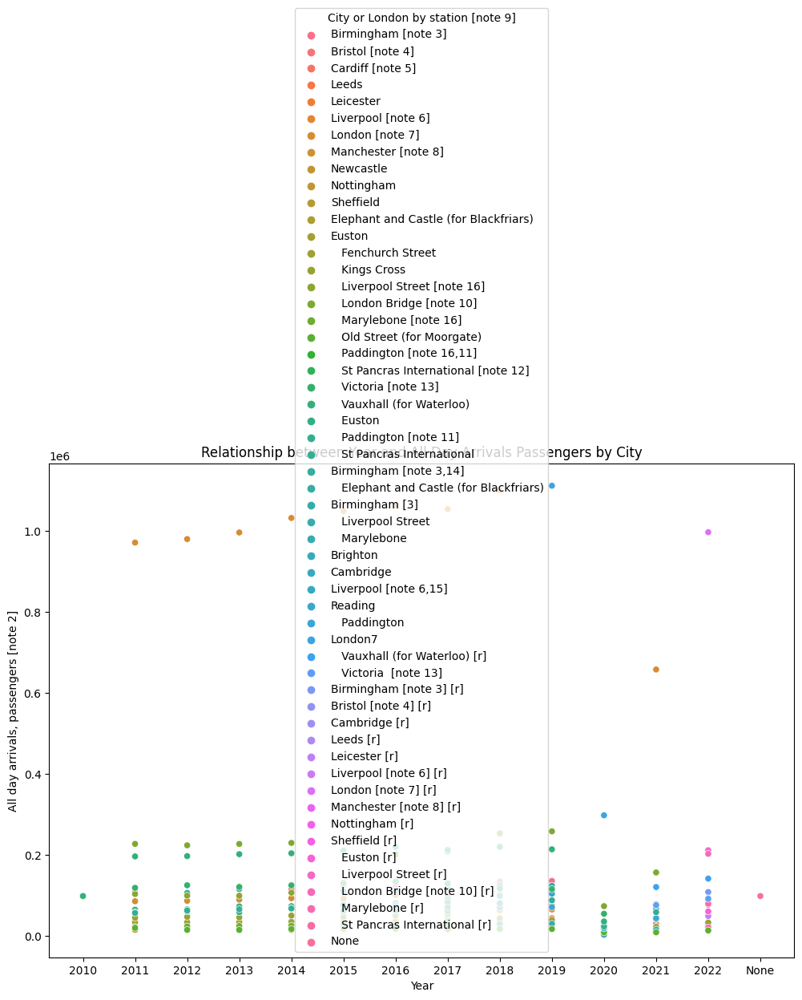

In [607]:
# Explore relationships between variables
plt.figure(figsize=(12, 8))
sns.scatterplot(x='Year', y='All day arrivals, passengers [note 2]', hue='City or London by station [note 9]', data=df2)
plt.title('Relationship between Year and All Day Arrivals Passengers by City')
plt.xlabel('Year')
plt.ylabel('All day arrivals, passengers [note 2]')
plt.show()

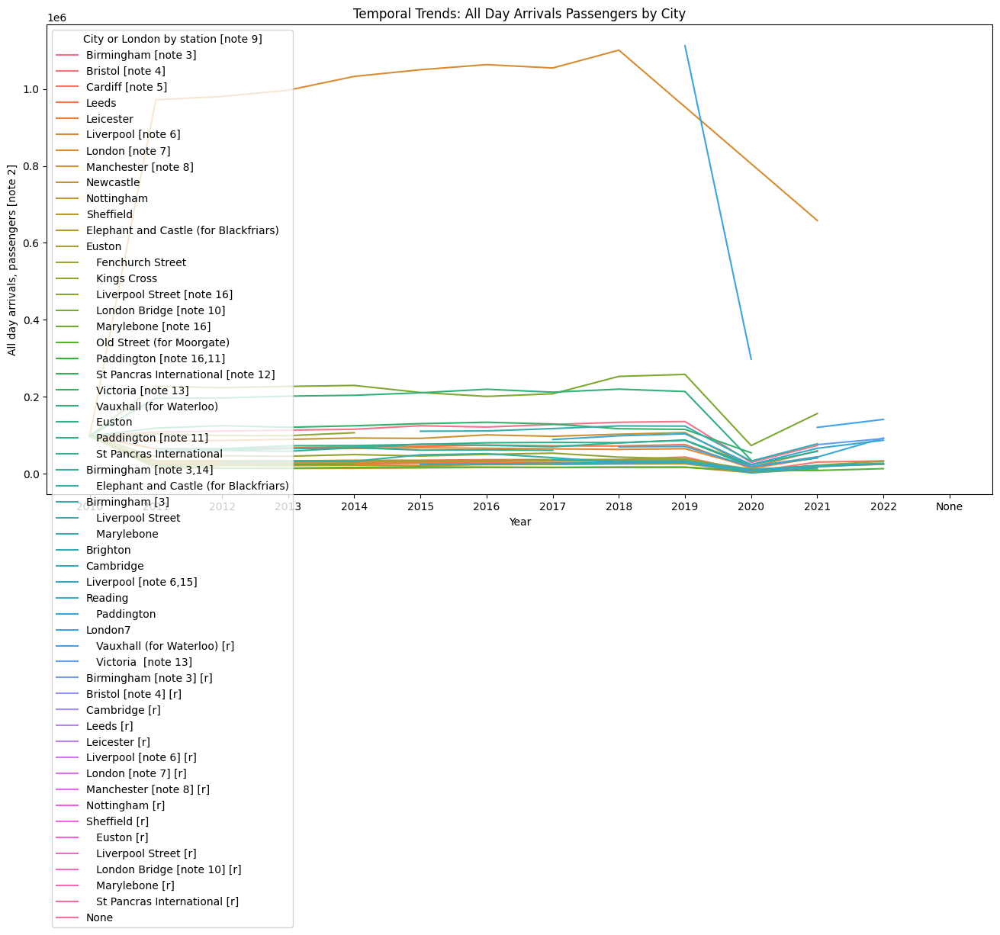

In [608]:
# Visualize temporal trends in passenger counts
plt.figure(figsize=(16, 8))
sns.lineplot(x='Year', y='All day arrivals, passengers [note 2]', hue='City or London by station [note 9]', data=df2)
plt.title('Temporal Trends: All Day Arrivals Passengers by City')
plt.xlabel('Year')
plt.ylabel('All day arrivals, passengers [note 2]')
plt.show()

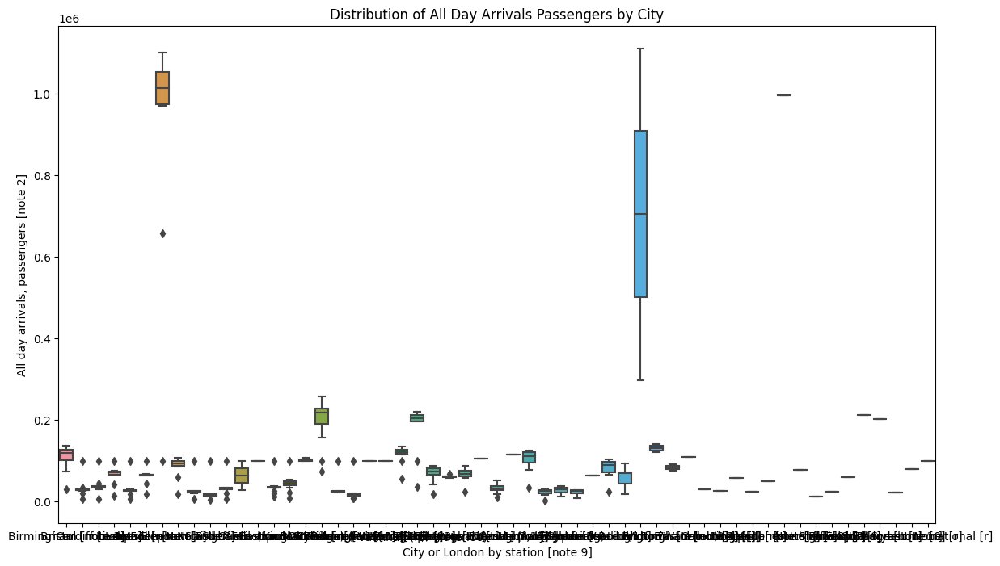

In [609]:
# Explore distribution of passenger counts by city
plt.figure(figsize=(14, 8))
sns.boxplot(x='City or London by station [note 9]', y='All day arrivals, passengers [note 2]', data=df2)
plt.title('Distribution of All Day Arrivals Passengers by City')
plt.xlabel('City or London by station [note 9]')
plt.ylabel('All day arrivals, passengers [note 2]')
plt.show()

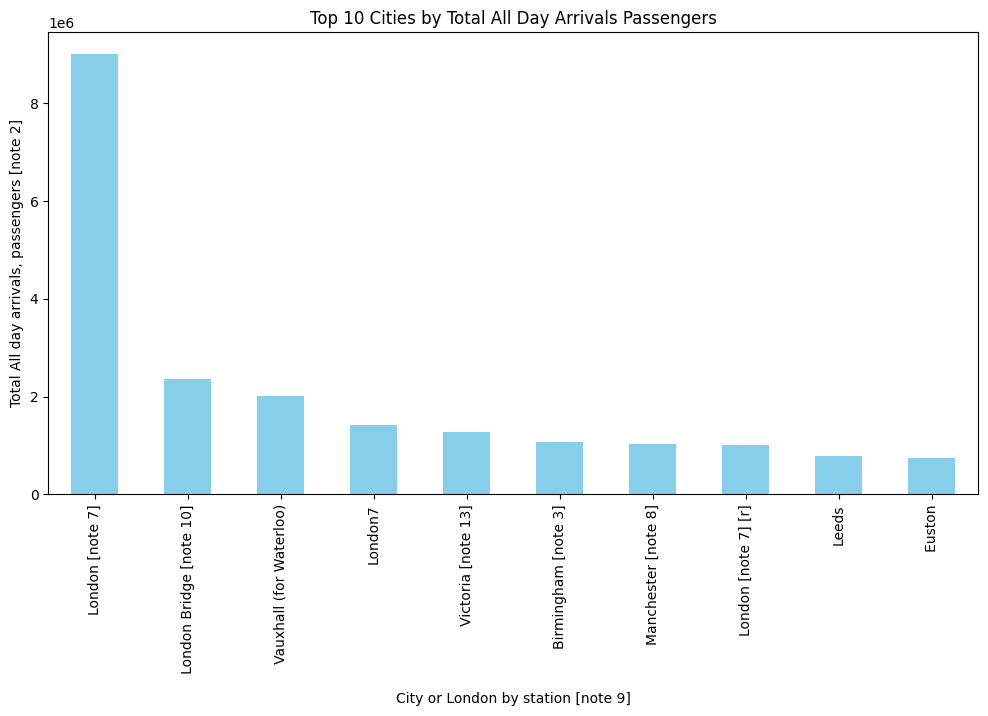

In [610]:
# Explore top cities with the highest passenger counts
top_cities = df2.groupby('City or London by station [note 9]')['All day arrivals, passengers [note 2]'].sum().nlargest(10)
plt.figure(figsize=(12, 6))
top_cities.plot(kind='bar', color='skyblue')
plt.title('Top 10 Cities by Total All Day Arrivals Passengers')
plt.xlabel('City or London by station [note 9]')
plt.ylabel('Total All day arrivals, passengers [note 2]')
plt.show()

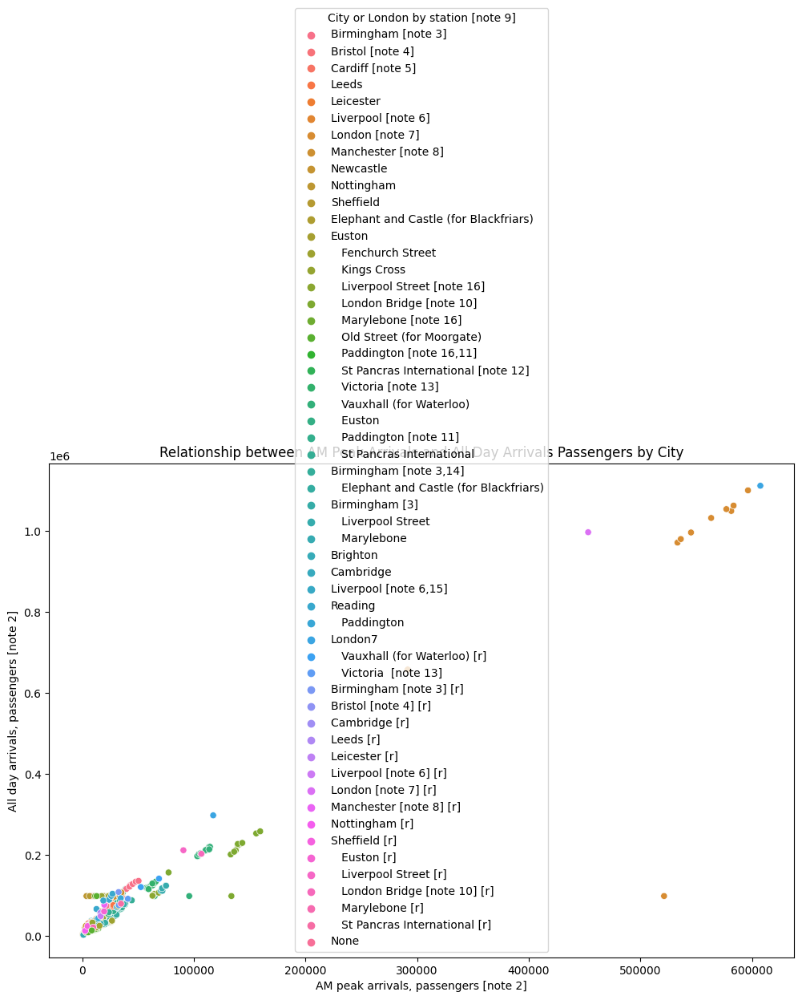

In [611]:
# Explore relationships between variables (e.g., 'All day arrivals' vs. 'AM peak arrivals')
plt.figure(figsize=(12, 8))
sns.scatterplot(x='AM peak arrivals (07:00 to 09:59), passengers [note 2]',
                y='All day arrivals, passengers [note 2]',
                hue='City or London by station [note 9]', data=df2)
plt.title('Relationship between AM Peak Arrivals and All Day Arrivals Passengers by City')
plt.xlabel('AM peak arrivals, passengers [note 2]')
plt.ylabel('All day arrivals, passengers [note 2]')
plt.show()

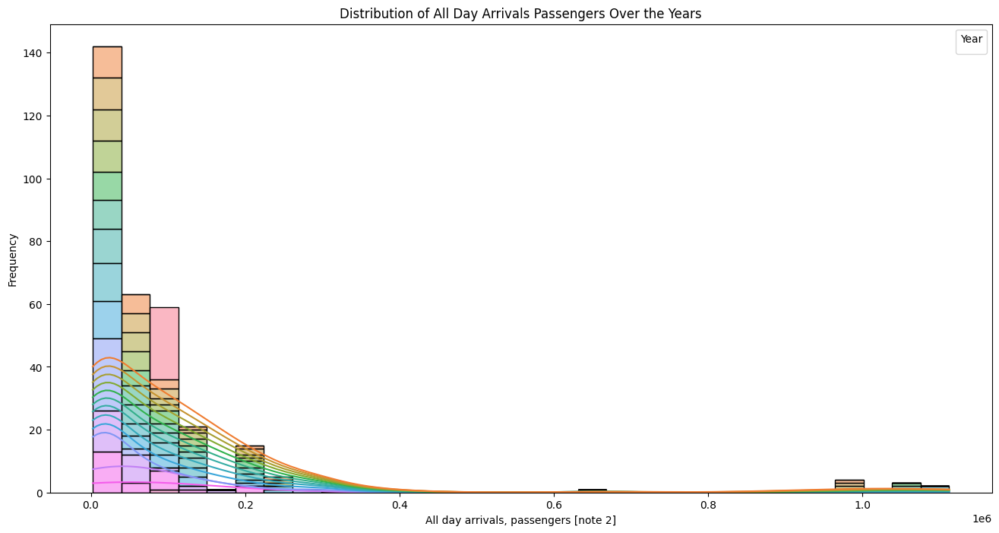

In [612]:
# Distribution of passenger counts by year
plt.figure(figsize=(16, 8))
sns.histplot(data=df2, x='All day arrivals, passengers [note 2]', hue='Year', multiple='stack', bins=30, kde=True)
plt.title('Distribution of All Day Arrivals Passengers Over the Years')
plt.xlabel('All day arrivals, passengers [note 2]')
plt.ylabel('Frequency')
plt.legend(title='Year')
plt.show()

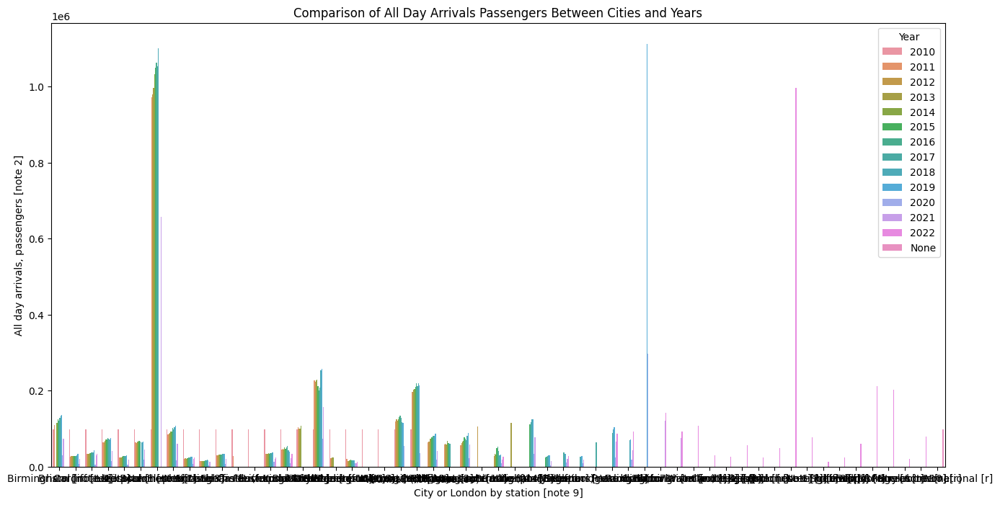

In [613]:
# Compare passenger counts between cities and years
plt.figure(figsize=(16, 8))
sns.barplot(x='City or London by station [note 9]', y='All day arrivals, passengers [note 2]', hue='Year', data=df2)
plt.title('Comparison of All Day Arrivals Passengers Between Cities and Years')
plt.xlabel('City or London by station [note 9]')
plt.ylabel('All day arrivals, passengers [note 2]')
plt.legend(title='Year', loc='upper right')
plt.show()

<ipython-input-614-a5ecc623faba>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df2.corr()


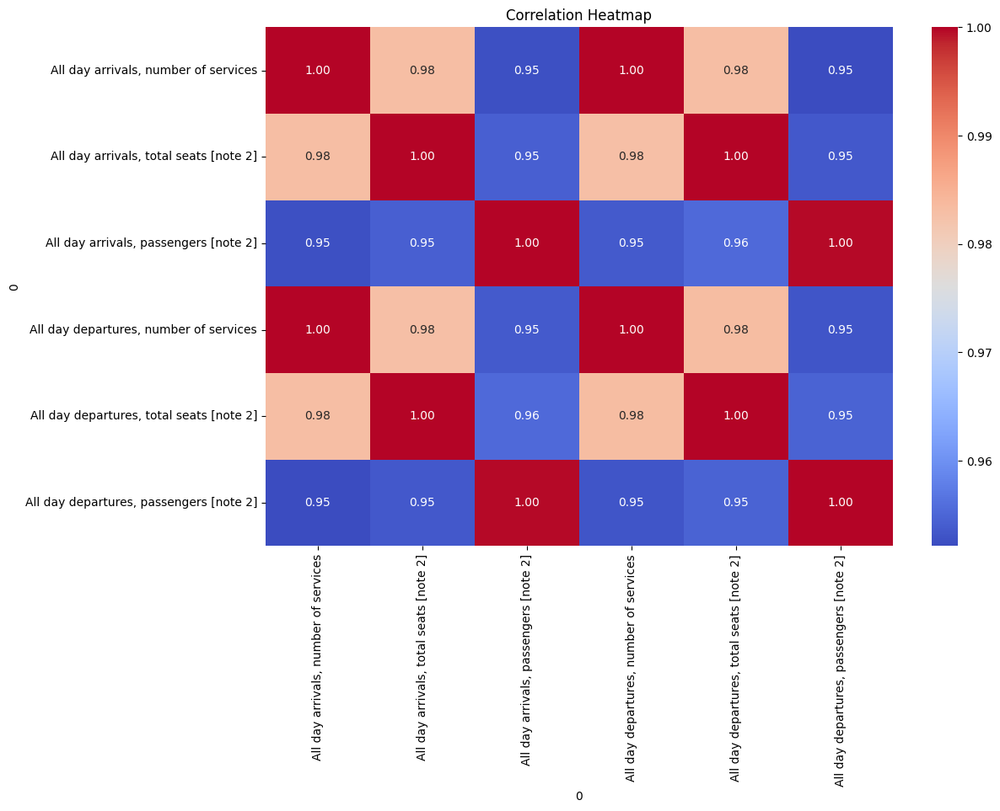

In [614]:
# Correlation heatmap
correlation_matrix = df2.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

In [615]:
red_line_df = df[df['Luas Line'] == 'Red line']['VALUE']
green_line_df = df[df['Luas Line'] == 'Green line']['VALUE']
t_stat, p_value = ttest_rel(red_line_df, green_line_df)
print(f"Paired t-test for Temporal Patterns in df (Red line vs. Green line): t-statistic = {t_stat:.4f}, p-value = {p_value:.4f}")
# Justification: This test compares the means of two related groups, which can be useful for analyzing temporal patterns within each Luas line.

Paired t-test for Temporal Patterns in df (Red line vs. Green line): t-statistic = 9.6234, p-value = 0.0000


In [616]:
passenger_df = df[df['UNIT'] == 'Number']['VALUE']
passenger_df2 = df2['All day arrivals, passengers [note 2]'].dropna()
u_stat, p_value = mannwhitneyu(passenger_df, passenger_df2)
print(f"Mann-Whitney U Test for Passenger Distribution: U-statistic = {u_stat:.4f}, p-value = {p_value:.4f}")
# Justification: This non-parametric test assesses whether the distributions of two independent samples are equal or not.

Mann-Whitney U Test for Passenger Distribution: U-statistic = 0.0000, p-value = 0.0000


In [617]:
years_df = df['Year'].unique()
years_df2 = df2['Year'].unique()
f_stat, p_value = f_oneway(*[df[df['Year'] == year]['VALUE'] for year in years_df])
print(f"ANOVA for Yearly Comparison in df: F-statistic = {f_stat:.4f}, p-value = {p_value:.4f}")
# Justification: ANOVA is suitable for comparing means across multiple groups, helping to identify significant differences between years.

ANOVA for Yearly Comparison in df: F-statistic = 119.1020, p-value = 0.0000


In [618]:
luas_line_crosstab = pd.crosstab(df['Luas Line'], df['Week Number'])
chi2_stat, p_value, _, _ = chi2_contingency(luas_line_crosstab)
print(f"Chi-squared Test for Luas Line Variations in df: Chi2-statistic = {chi2_stat:.4f}, p-value = {p_value:.4f}")
# Justification: This test examines the association between categorical variables, which can help analyze variations in luas lines across weeks.

Chi-squared Test for Luas Line Variations in df: Chi2-statistic = 0.0000, p-value = 1.0000


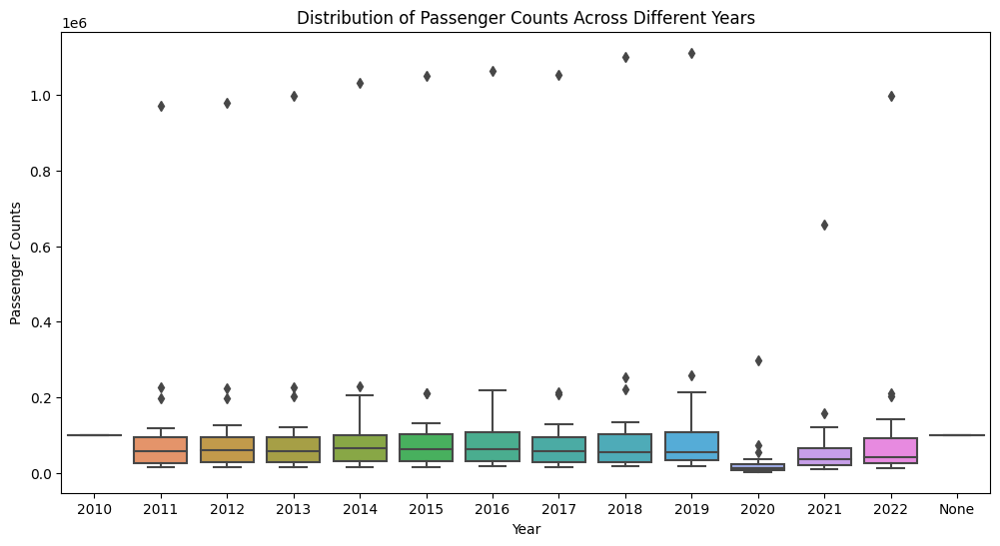

Independent t-test for the first and last year: t-statistic = 0.9574, p-value = 0.3488
There is no significant difference in means.


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


In [619]:
# Filter out rows where 'All day arrivals, passengers [note 2]' is not NaN
filtered_df2 = df2.dropna(subset=['All day arrivals, passengers [note 2]'])
# Visualize the distribution of passenger counts across different years
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year', y='All day arrivals, passengers [note 2]', data=filtered_df2)
plt.title('Distribution of Passenger Counts Across Different Years')
plt.xlabel('Year')
plt.ylabel('Passenger Counts')
plt.show()
# Statistical testing: Compare the means of passenger counts in the first and last year
first_year_data = filtered_df2[filtered_df2['Year'] == filtered_df2['Year'].min()]['All day arrivals, passengers [note 2]']
last_year_data = filtered_df2[filtered_df2['Year'] == filtered_df2['Year'].max()]['All day arrivals, passengers [note 2]']
t_stat, p_value = ttest_ind(first_year_data, last_year_data)
print(f"Independent t-test for the first and last year: t-statistic = {t_stat:.4f}, p-value = {p_value:.4f}")
# Interpretation: The p-value indicates whether there is a significant difference in means.
# If p-value is less than 0.05, we reject the null hypothesis of equal means.
if p_value < 0.05:
    print("The difference in means is statistically significant.")
else:
    print("There is no significant difference in means.")

In [620]:
df2

,Year,City or London by station [note 9],"AM peak arrivals (07:00 to 09:59), number of services","AM peak arrivals (07:00 to 09:59), total seats [note 2]","AM peak arrivals (07:00 to 09:59), passengers [note 2]","All day arrivals, number of services","All day arrivals, total seats [note 2]","All day arrivals, passengers [note 2]","PM peak departures (16:00 to 18:59), number of services","PM peak departures (16:00 to 18:59), total seats [note 2]",PM peak departures (16:00 to 18:59) passengers [note 2],"All day departures, number of services","All day departures, total seats [note 2]","All day departures, passengers [note 2]"
1,2010,Birmingham [note 3],181,49720,35756,615.836735,252298.106965,98330.494667,186,50273,36119,615.931973,250635.516691,96882.279173
2,2010,Bristol [note 4],52,12774,8276,615.836735,252298.106965,98330.494667,52,12169,8319,615.931973,250635.516691,96882.279173
3,2010,Cardiff [note 5],113,19901,10317,615.836735,252298.106965,98330.494667,114,19888,11105,615.931973,250635.516691,96882.279173
4,2010,Leeds,110,26906,23331,615.836735,252298.106965,98330.494667,112,27186,23763,615.931973,250635.516691,96882.279173
5,2010,Leicester,38,11056,5398,615.836735,252298.106965,98330.494667,37,10261,5916,615.931973,250635.516691,96882.279173
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
314,2022,Paddington,66,33639,34452.899048,354.000000,168850.000000,92887.083557,63,32025,33661.907903,353.000000,169426.000000,97376.458372
315,2022,St Pancras International [r],86,40647,34700.542857,451.000000,209441.000000,79453.881578,87,42905,31384.053073,457.000000,211544.000000,80753.980144
316,2022,Vauxhall (for Waterloo) [r],127,71716,68720,632.000000,347016.000000,141326.000000,122,69530,53108,627.000000,344112.000000,137474.000000
317,2022,Victoria [note 13],107,61776,40870,550.000000,299330.000000,91494.000000,104,60455,35684,552.000000,298712.000000,90198.000000


In [621]:
# Drop rows where 'Year' is equal to 'None'
df2 = df2[df2['Year'] != 'None']

In [622]:
columns_to_encode = ['City or London by station [note 9]']
# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Apply label encoding to each specified column
for column in columns_to_encode:
    df2[column] = label_encoder.fit_transform(df2[column])

<ipython-input-622-7414a33955f7>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2[column] = label_encoder.fit_transform(df2[column])


In [623]:
# Create a MinMaxScaler
scaler = MinMaxScaler()
# Fit and transform the target variable
df2['All day arrivals, passengers [note 2]'] = scaler.fit_transform(df2[['All day arrivals, passengers [note 2]']])

<ipython-input-623-089325b7cd87>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['All day arrivals, passengers [note 2]'] = scaler.fit_transform(df2[['All day arrivals, passengers [note 2]']])


In [624]:
# Features (X)
X = df2[['Year',	'City or London by station [note 9]']]
# Target variable (y): 'All day arrivals, passengers [note 2]'
y = df2['All day arrivals, passengers [note 2]']

In [625]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [626]:
# Ridge Regression
ridge_model = Ridge()
ridge_param_grid = {'alpha': [0.1, 1, 10]}
ridge_grid = GridSearchCV(ridge_model, ridge_param_grid, cv=5, scoring='neg_mean_squared_error')
ridge_grid.fit(X_train, y_train)
y_pred_ridge = ridge_grid.predict(X_test)

In [627]:
# Evaluation Metrics
mse_ridge = mean_squared_error(y_test, y_pred_ridge)
r2_ridge = r2_score(y_test, y_pred_ridge)
mae_ridge = mean_absolute_error(y_test, y_pred_ridge)

In [628]:
# Print Metrics
print(f'Ridge Regression - Mean Squared Error: {mse_ridge:.4f}')
print(f'Ridge Regression - R-squared: {r2_ridge:.4f}')
print(f'Ridge Regression - Mean Absolute Error: {mae_ridge:.4f}')

Ridge Regression - Mean Squared Error: 0.0144
Ridge Regression - R-squared: -0.0819
Ridge Regression - Mean Absolute Error: 0.0740


In [629]:
# Lasso Regression
lasso_model = Lasso()
lasso_param_grid = {'alpha': [0.1, 1, 10]}
lasso_grid = GridSearchCV(lasso_model, lasso_param_grid, cv=5, scoring='neg_mean_squared_error')
lasso_grid.fit(X_train, y_train)
y_pred_lasso = lasso_grid.predict(X_test)

In [630]:
# Evaluation Metrics
mse_lasso = mean_squared_error(y_test, y_pred_lasso)
r2_lasso = r2_score(y_test, y_pred_lasso)
mae_lasso = mean_absolute_error(y_test, y_pred_lasso)

In [631]:
# Print Metrics
print(f'Lasso Regression - Mean Squared Error: {mse_lasso:.4f}')
print(f'Lasso Regression - R-squared: {r2_lasso:.4f}')
print(f'Lasso Regression - Mean Absolute Error: {mae_lasso:.4f}')

Lasso Regression - Mean Squared Error: 0.0144
Lasso Regression - R-squared: -0.0774
Lasso Regression - Mean Absolute Error: 0.0724


In [632]:
# Random Forest Regression
rf_model = RandomForestRegressor(random_state=42)
rf_param_grid = {'n_estimators': [50, 100, 200], 'max_depth': [None, 10, 20], 'min_samples_split': [2, 5, 10]}
rf_grid = GridSearchCV(rf_model, rf_param_grid, cv=5, scoring='neg_mean_squared_error')
rf_grid.fit(X_train, y_train)
y_pred_rf = rf_grid.predict(X_test)

In [633]:
# Evaluation Metrics
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)

In [634]:
# Print Metrics
print(f'Random Forest Regression - Mean Squared Error: {mse_rf:.4f}')
print(f'Random Forest Regression - R-squared: {r2_rf:.4f}')
print(f'Random Forest Regression - Mean Absolute Error: {mae_rf:.4f}')

Random Forest Regression - Mean Squared Error: 0.0003
Random Forest Regression - R-squared: 0.9757
Random Forest Regression - Mean Absolute Error: 0.0111


In [635]:
# Support Vector Regression (SVR)
svr_model = SVR()
svr_param_grid = {'C': [0.1, 1, 10], 'epsilon': [0.01, 0.1, 1]}
svr_grid = GridSearchCV(svr_model, svr_param_grid, cv=5, scoring='neg_mean_squared_error')
svr_grid.fit(X_train, y_train)
y_pred_svr = svr_grid.predict(X_test)

In [636]:
# Evaluation Metrics
mse_svr = mean_squared_error(y_test, y_pred_svr)
r2_svr = r2_score(y_test, y_pred_svr)
mae_svr = mean_absolute_error(y_test, y_pred_svr)

In [637]:
# Print Metrics
print(f'Support Vector Regression - Mean Squared Error: {mse_svr:.4f}')
print(f'Support Vector Regression - R-squared: {r2_svr:.4f}')
print(f'Support Vector Regression - Mean Absolute Error: {mae_svr:.4f}')

Support Vector Regression - Mean Squared Error: 0.0153
Support Vector Regression - R-squared: -0.1446
Support Vector Regression - Mean Absolute Error: 0.0818


In [638]:
# Gradient Boosting Regression
gb_model = GradientBoostingRegressor()
gb_param_grid = {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 0.2], 'max_depth': [3, 5, 10]}
gb_grid = GridSearchCV(gb_model, gb_param_grid, cv=5, scoring='neg_mean_squared_error')
gb_grid.fit(X_train, y_train)
y_pred_gb = gb_grid.predict(X_test)

In [639]:
# Evaluation Metrics
mse_gb = mean_squared_error(y_test, y_pred_gb)
r2_gb = r2_score(y_test, y_pred_gb)
mae_gb = mean_absolute_error(y_test, y_pred_gb)

In [640]:
# Print Metrics
print(f'Gradient Boosting Regression - Mean Squared Error: {mse_gb:.4f}')
print(f'Gradient Boosting Regression - R-squared: {r2_gb:.4f}')
print(f'Gradient Boosting Regression - Mean Absolute Error: {mae_gb:.4f}')

Gradient Boosting Regression - Mean Squared Error: 0.0004
Gradient Boosting Regression - R-squared: 0.9681
Gradient Boosting Regression - Mean Absolute Error: 0.0156
